<a href="https://colab.research.google.com/github/kayal466/Final-Project/blob/main/Final_Project_Kayalvizhi_DW26.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The main scope of this project is to predict the breast cancer whether the feature belongs to Malignant or Benign. M represents malignant B represents benign.

**Importing Essential Libraries**

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

**Loading the data set**

In [ ]:
df=pd.read_csv("/content/cancer.csv")
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


**Details of the dataset**

In [ ]:
df.shape

(569, 33)

In [ ]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [ ]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In this dataset there is no null values so noneed of any missing value imputations. column Unnamed:32 as this not contains any values we can drop this columns.

**Statistical summary of this data set**

In [ ]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

**Visualizing the data**

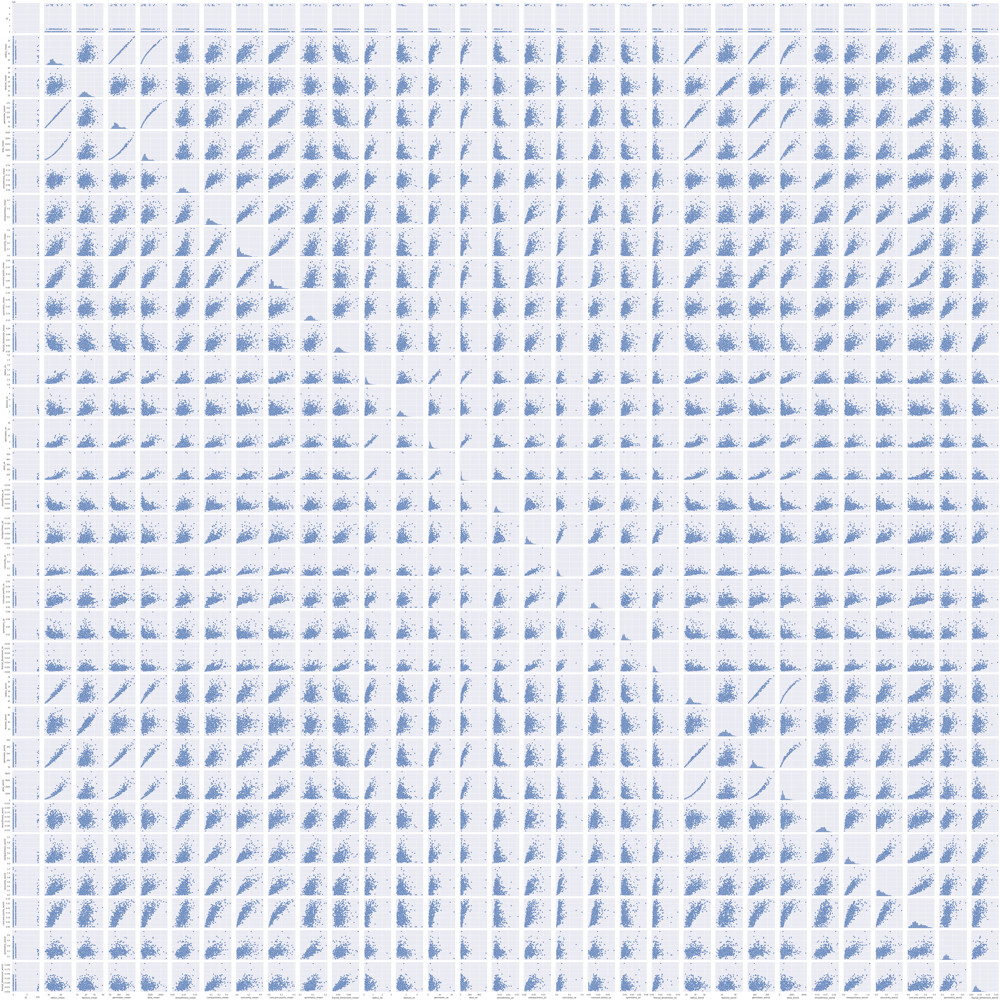

In [ ]:
sns.pairplot(df)

**Correlation** 

In [ ]:
df.corr()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
id,1.000000,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,...,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866,NaN
radius_mean,0.074626,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,NaN
texture_mean,0.099770,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,NaN
perimeter_mean,0.073159,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,NaN
area_mean,0.096893,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,NaN
smoothness_mean,-0.012968,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,NaN
compactness_mean,0.000096,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,NaN
concavity_mean,0.050080,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,NaN
concave points_mean,0.044158,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,NaN
symmetry_mean,-0.022114,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,NaN


In [ ]:
corelation=df.corr()

**covariance** 

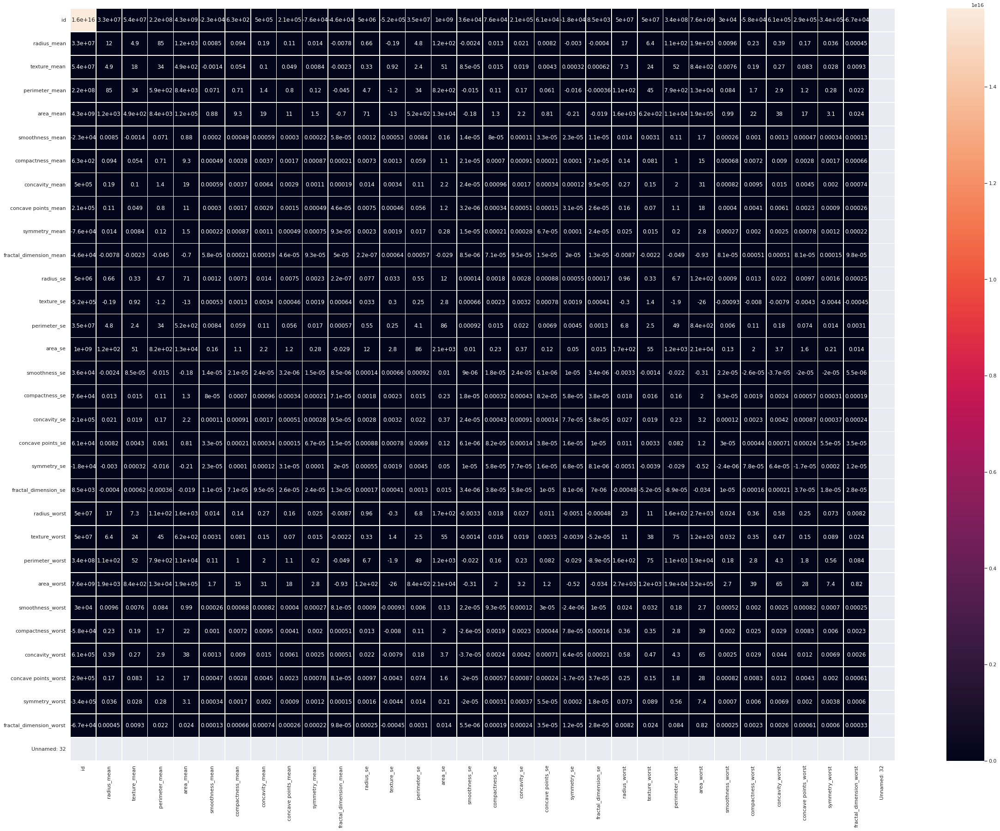

In [ ]:
plt.figure(figsize = (40,30))
sns.heatmap(df.cov(), annot = True, linewidth = 0.5)
plt.show()

In [ ]:
del df['Unnamed: 32']# deleting the unrelevant column

In [ ]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


**Creating copy of the data**

In [ ]:
df1=df.copy(deep=True)

**Visualizing the distribution of the data points**

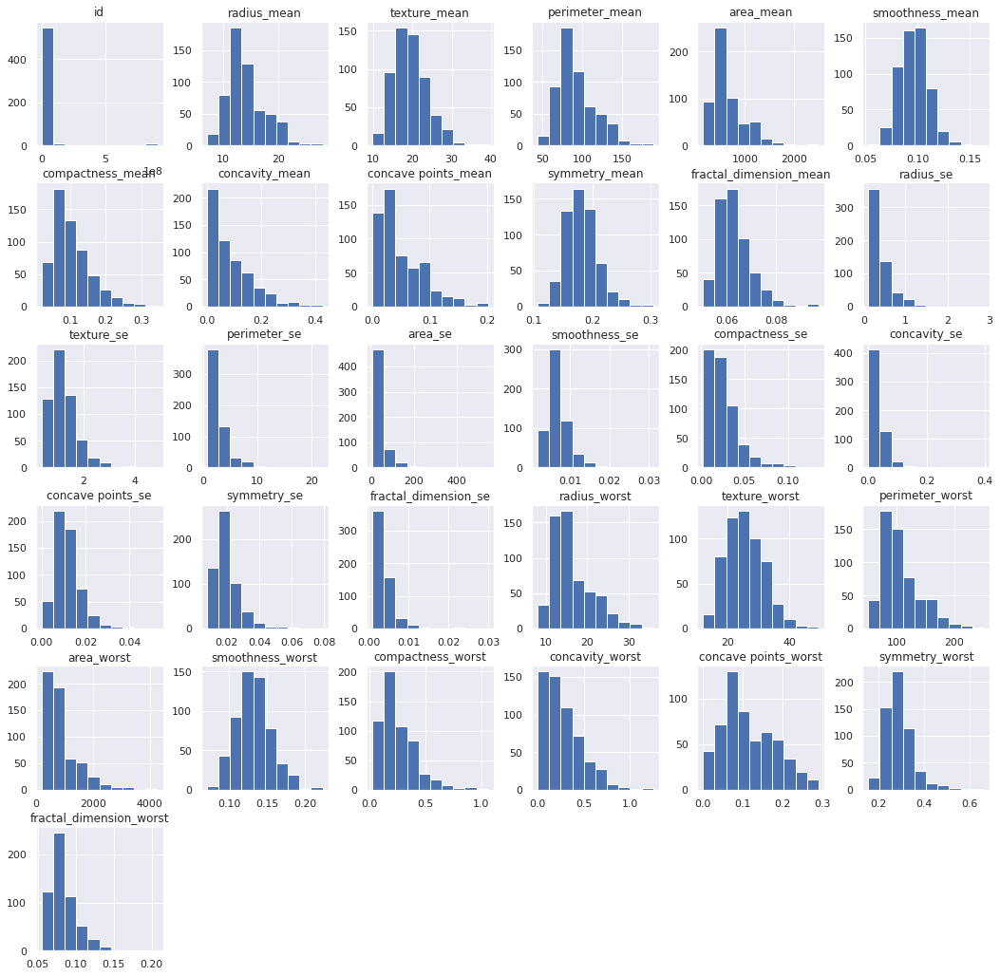

In [ ]:
fig= df1.hist(figsize = (18,18))

**Spliting the independent and dependent columns for the feature selection**

In [ ]:
x=df1.iloc[:,2:32]
y1=df1.iloc[:,1]


In [ ]:
x

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
y1

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

**Selecting the top score features for the model based on chi2 test**

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2 
features=SelectKBest(score_func=chi2,k=20)
fit=features.fit(x,y1)

In [ ]:
dfscores=pd.DataFrame(fit.scores_)
dfcolumns=pd.DataFrame(x.columns)

In [ ]:
featurescore=pd.concat([dfcolumns,dfscores],axis=1)
featurescore.columns=['specs','score']

In [ ]:
featurescore

,specs,score
0,radius_mean,266.104917
1,texture_mean,93.897508
2,perimeter_mean,2011.102864
3,area_mean,53991.655924
4,smoothness_mean,0.149899
5,compactness_mean,5.403075
6,concavity_mean,19.712354
7,concave points_mean,10.544035
8,symmetry_mean,0.257380
9,fractal_dimension_mean,0.000074


**Top 20 scored features for the model**

In [ ]:
print(featurescore.nlargest(20,'score'))

                   specs          score
23            area_worst  112598.431564
3              area_mean   53991.655924
13               area_se    8758.504705
22       perimeter_worst    3665.035416
2         perimeter_mean    2011.102864
20          radius_worst     491.689157
0            radius_mean     266.104917
12          perimeter_se     250.571896
21         texture_worst     174.449400
1           texture_mean      93.897508
26       concavity_worst      39.516915
10             radius_se      34.675247
6         concavity_mean      19.712354
25     compactness_worst      19.314922
27  concave points_worst      13.485419
7    concave points_mean      10.544035
5       compactness_mean       5.403075
28        symmetry_worst       1.298861
16          concavity_se       1.044718
15        compactness_se       0.613785


**Least score Features**

In [ ]:
print(featurescore.nsmallest(12,'score'))

                      specs     score
9    fractal_dimension_mean  0.000074
18              symmetry_se  0.000080
14            smoothness_se  0.003266
19     fractal_dimension_se  0.006371
11               texture_se  0.009794
4           smoothness_mean  0.149899
29  fractal_dimension_worst  0.231522
8             symmetry_mean  0.257380
17        concave points_se  0.305232
24         smoothness_worst  0.397366
15           compactness_se  0.613785
16             concavity_se  1.044718


**Visualizing the Correlation values**

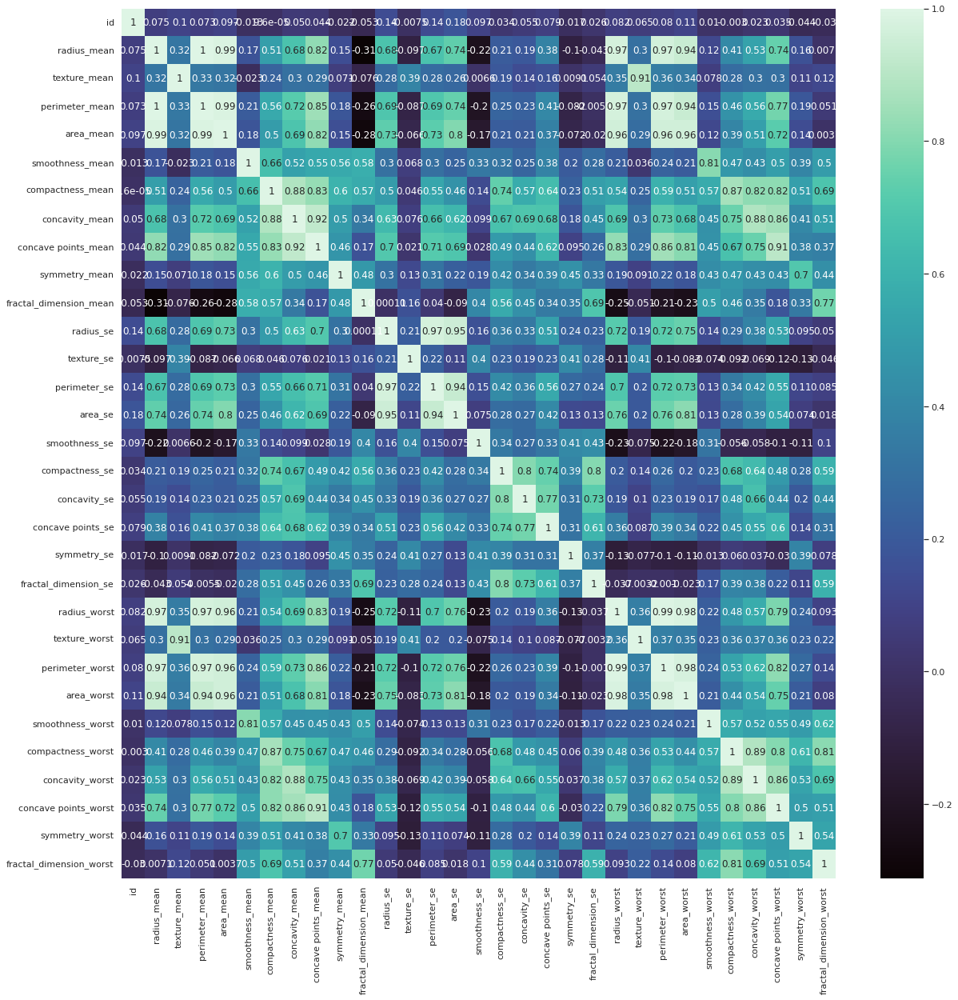

In [ ]:
corr1=df1.corr()
#top_corr_feature= corrmat.index
plt.figure(figsize=(20,20))
k=sns.heatmap(df1.corr(),annot=True,cmap='mako')

In [ ]:
del df1['id'] # Id doesnot provide any valuable information to the data we can drop it.

In [ ]:
df1.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

**Visualizing the pairplot with the target with the independent columns**

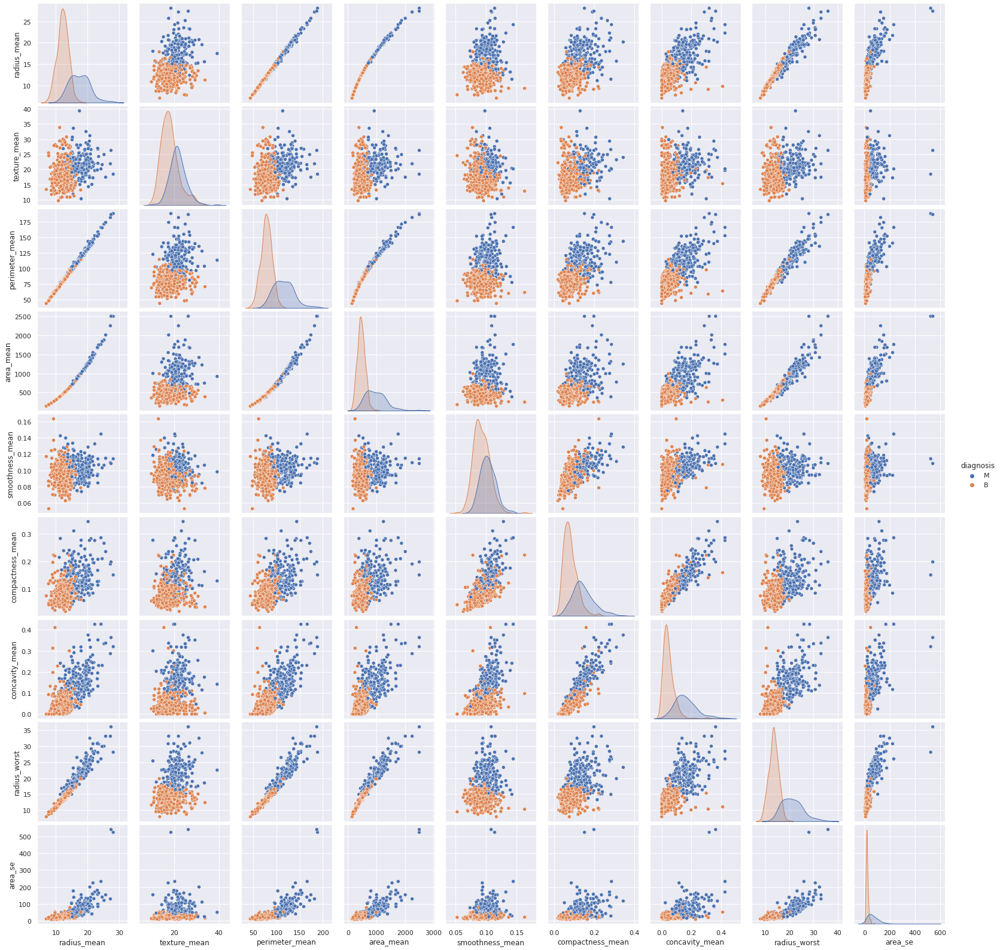

In [ ]:
sns.pairplot(df1 ,hue ='diagnosis', vars =['radius_mean','texture_mean', 'perimeter_mean', 'area_mean',
 'smoothness_mean', 'compactness_mean' ,'concavity_mean','radius_worst','area_se'])

**Visualization of the target columns**

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


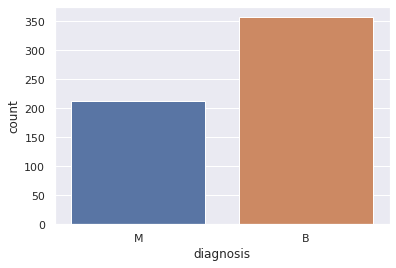

In [ ]:
sns.countplot(df1['diagnosis'])

**Splitting the data for model**

In [ ]:
c = df1.columns.tolist()
c = [i for i in c if i not in ['fractal_dimension_mean','symmetry_se','smoothness_se','fractal_dimension_se','texture_se','fractal_dimension_worst','symmetry_mean','concave points_se','smoothness_mean','smoothness_worst','diagnosis']]
x1 = df1[c]
y1 = df1['diagnosis'] 

In [ ]:
x1.count()

radius_mean             569
texture_mean            569
perimeter_mean          569
area_mean               569
compactness_mean        569
concavity_mean          569
concave points_mean     569
radius_se               569
perimeter_se            569
area_se                 569
compactness_se          569
concavity_se            569
radius_worst            569
texture_worst           569
perimeter_worst         569
area_worst              569
compactness_worst       569
concavity_worst         569
concave points_worst    569
symmetry_worst          569
dtype: int64

In [ ]:
y1

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size = 0.3,random_state=5)

*As i have taken 20 features for the model and test size = 0.3*

In [ ]:
x_train

,radius_mean,texture_mean,perimeter_mean,area_mean,compactness_mean,concavity_mean,concave points_mean,radius_se,perimeter_se,area_se,compactness_se,concavity_se,radius_worst,texture_worst,perimeter_worst,area_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
47,13.170,18.66,85.98,534.6,0.12310,0.12260,0.07340,0.2871,1.8970,24.250,0.023360,0.029050,15.67,27.95,102.80,759.4,0.4166,0.50060,0.20880,0.3900
527,12.340,12.27,78.94,468.5,0.06307,0.02958,0.02647,0.1166,0.7714,8.955,0.009169,0.008732,13.61,19.27,87.22,564.9,0.2074,0.17910,0.10700,0.3110
435,13.980,19.62,91.12,599.5,0.11330,0.11260,0.06463,0.2208,1.6020,18.850,0.017910,0.021850,17.04,30.80,113.90,869.3,0.3568,0.40690,0.18270,0.3179
21,9.504,12.44,60.34,273.9,0.06492,0.02956,0.02076,0.2773,1.9090,15.700,0.014320,0.019850,10.23,15.66,65.13,314.9,0.1148,0.08867,0.06227,0.2450
554,12.880,28.92,82.50,514.3,0.05824,0.06195,0.02343,0.2116,1.5020,16.830,0.021530,0.038980,13.89,35.74,88.84,595.7,0.1620,0.24390,0.06493,0.2372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8,13.000,21.82,87.50,519.8,0.19320,0.18590,0.09353,0.3063,2.4060,24.320,0.035020,0.035530,15.49,30.73,106.20,739.3,0.5401,0.53900,0.20600,0.4378
73,13.800,15.79,90.43,584.1,0.12800,0.07789,0.05069,0.2787,1.9570,23.350,0.020650,0.017590,16.57,20.86,110.30,812.4,0.3542,0.27790,0.13830,0.2589
400,17.910,21.02,124.40,994.0,0.25760,0.31890,0.11980,0.4030,3.1230,41.510,0.037180,0.061650,20.80,27.78,149.60,1304.0,0.5917,0.90340,0.19640,0.3245
118,15.780,22.91,105.70,782.6,0.17520,0.21330,0.09479,0.5520,3.5980,58.630,0.039760,0.059500,20.19,30.50,130.30,1272.0,0.4925,0.73560,0.20340,0.3274


In [ ]:
y_train

47     M
527    B
435    M
21     B
554    B
      ..
8      M
73     M
400    M
118    M
206    B
Name: diagnosis, Length: 398, dtype: object

***Traning the model with SVM ***

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report , confusion_matrix
svc_model= SVC()
svc_model.fit(x_train,y_train)

SVC()

In [ ]:
y_predict =svc_model.predict(x_test)

In [ ]:
y_predict

array(['M', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B',
       'B', 'M', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'B', 'M', 'B', 'B',
       'M', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'M', 'B', 'M', 'B', 'B',
       'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'M', 'B', 'B', 'B', 'B',
       'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B',
       'M', 'M', 'M', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'M', 'M', 'M',
       'M', 'B', 'B', 'M', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B',
       'M', 'M', 'B', 'M', 'B', 'M', 'B', 'M', 'B', 'M', 'B', 'B', 'M',
       'B', 'M', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'M', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B',
       'M', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'M', 'B', 'B', 'B',
       'B', 'B'], dtype=object)

In [ ]:
cm = confusion_matrix(y_test,y_predict)

In [ ]:
cm

array([[108,   2],
       [  3,  58]])

**Visualization of the confusion matrix**

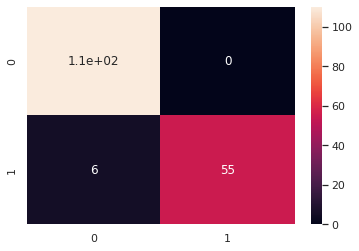

In [ ]:
sns.heatmap(cm ,annot=True)

**SVM Classification Report**

* An accuracy of 96% has achieved 

In [ ]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           B       0.95      1.00      0.97       110
           M       1.00      0.90      0.95        61

    accuracy                           0.96       171
   macro avg       0.97      0.95      0.96       171
weighted avg       0.97      0.96      0.96       171



**Standardizing the data for ensemble technique and improvisation of the model accuracy**

Importing standard scaler

In [ ]:
from sklearn.preprocessing import StandardScaler
x_train=StandardScaler().fit_transform(x_train)
x_test=StandardScaler().fit_transform(x_test)


**ENSEMBLING THE MODEL**

In [ ]:
from sklearn.ensemble import VotingClassifier # this is the function that ensembles my model
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score
model1 = LogisticRegression(random_state=1)
model2 = tree.DecisionTreeClassifier(random_state=1)
model3 = KNeighborsClassifier(3)
model = VotingClassifier(estimators=[('lr', model1), ('dt', model2),('knn',model3)], voting='soft')
model.fit(x_train,y_train) # to train all of the models
preds = model.predict(x_test)
model.score(x_test,y_test) # prediction
roc_auc_score(y_test,model.predict_proba(x_test)[:,1])

0.9909090909090907

*LogisticRegression*

In [ ]:
model1 = LogisticRegression(random_state=1)
model1.fit(x_train,y_train)
roc_auc_score(y_test,model1.predict_proba(x_test)[:,1])

0.9926974664679582

*DecisionTreeClassifier*

In [ ]:
model2 = tree.DecisionTreeClassifier(random_state=1)
model2.fit(x_train,y_train)
roc_auc_score(y_test,model2.predict_proba(x_test)[:,1])

0.930849478390462

**KNeighborsClassifier**

In [ ]:
model3 = KNeighborsClassifier(10)
model3.fit(x_train,y_train)
roc_auc_score(y_test,model3.predict_proba(x_test)[:,1])

0.9884500745156483

*BaggingClassifier*

In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn import tree
model = BaggingClassifier(tree.DecisionTreeClassifier(max_depth = 1, random_state=1), n_estimators=100)
model.fit(x_train, y_train)
model.score(x_test,y_test)

0.9590643274853801

**GradientBoostingClassifier**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.model_selection import cross_val_score
import numpy as np
for lr in [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15,0.2,0.5,0.7,1]:
  model = GradientBoostingClassifier(learning_rate = lr, n_estimators=100) # initialise the model
  model.fit(x_train,y_train) #train the model
  model.score(x_test, y_test) # scoring the model - r2 squared
  print("Learning rate : ", lr, " Train score : ", model.score(x_train,y_train), " Cross-Val score : ", np.mean(cross_val_score(model, x_train, y_train, cv=10)))

Learning rate :  0.01  Train score :  0.992462311557789  Cross-Val score :  0.9420512820512821
Learning rate :  0.02  Train score :  0.9974874371859297  Cross-Val score :  0.939551282051282
Learning rate :  0.03  Train score :  0.9974874371859297  Cross-Val score :  0.947051282051282
Learning rate :  0.04  Train score :  1.0  Cross-Val score :  0.9445512820512821
Learning rate :  0.05  Train score :  1.0  Cross-Val score :  0.947051282051282
Learning rate :  0.06  Train score :  1.0  Cross-Val score :  0.949551282051282
Learning rate :  0.07  Train score :  1.0  Cross-Val score :  0.949551282051282
Learning rate :  0.08  Train score :  1.0  Cross-Val score :  0.9521153846153846
Learning rate :  0.09  Train score :  1.0  Cross-Val score :  0.9520512820512821
Learning rate :  0.1  Train score :  1.0  Cross-Val score :  0.9520512820512821
Learning rate :  0.11  Train score :  1.0  Cross-Val score :  0.949551282051282
Learning rate :  0.12  Train score :  1.0  Cross-Val score :  0.94948717

*RandomForestClassifier*

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
model4 = RandomForestClassifier(max_depth=2, random_state=0)
model4.fit(x_train, y_train)
model4.score(x_test,y_test)

0.9707602339181286

In [ ]:
predictions = model4.predict(x_test)

In [ ]:
predictions

array(['M', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'B', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B',
       'B', 'M', 'B', 'M', 'M', 'M', 'M', 'M', 'B', 'B', 'M', 'B', 'B',
       'M', 'B', 'B', 'B', 'M', 'B', 'B', 'M', 'M', 'B', 'M', 'B', 'B',
       'B', 'B', 'B', 'M', 'M', 'M', 'B', 'M', 'M', 'M', 'B', 'B', 'B',
       'B', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'B', 'B', 'B', 'M', 'B',
       'M', 'M', 'M', 'B', 'M', 'M', 'M', 'B', 'M', 'B', 'M', 'M', 'M',
       'M', 'B', 'B', 'M', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B',
       'M', 'M', 'B', 'M', 'B', 'B', 'B', 'M', 'M', 'M', 'B', 'B', 'M',
       'B', 'M', 'B', 'B', 'B', 'M', 'B', 'M', 'B', 'M', 'B', 'B', 'M',
       'B', 'B', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'B', 'B',
       'M', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M', 'B', 'B', 'B', 'M',
       'B', 'B', 'M', 'B', 'B', 'B', 'B', 'B', 'M', 'M', 'B', 'B', 'B',
       'B', 'B'], dtype=object)

In [ ]:
cm3 = confusion_matrix(y_test,predictions)

In [ ]:
cm3

array([[108,   2],
       [  3,  58]])

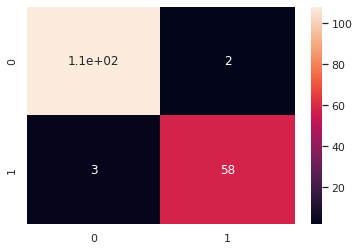

In [ ]:
sns.heatmap(cm ,annot=True)

**Random Forest Classification Report**
 * After scaling the data and traning the various model we have achieved the 97 % of accuracy. 

In [ ]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           B       0.97      0.98      0.98       110
           M       0.97      0.95      0.96        61

    accuracy                           0.97       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.97      0.97      0.97       171

